## GlobalLocal Multimodality

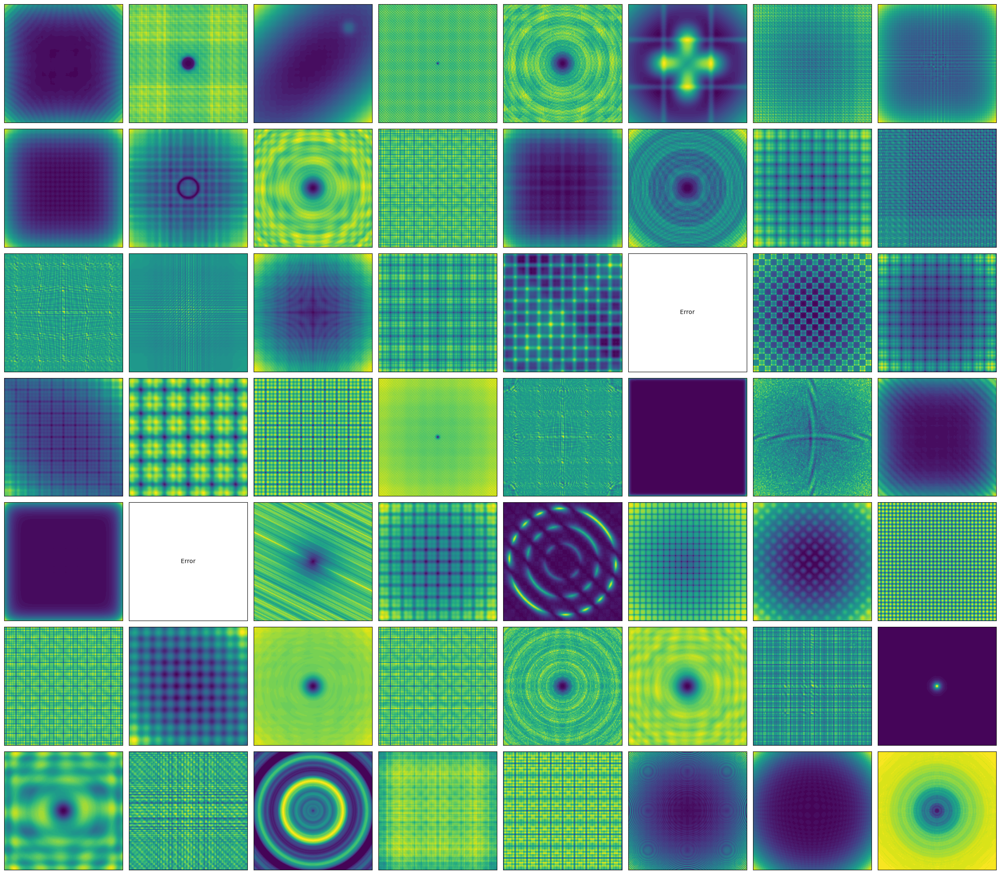

## Separable GlobalLocal

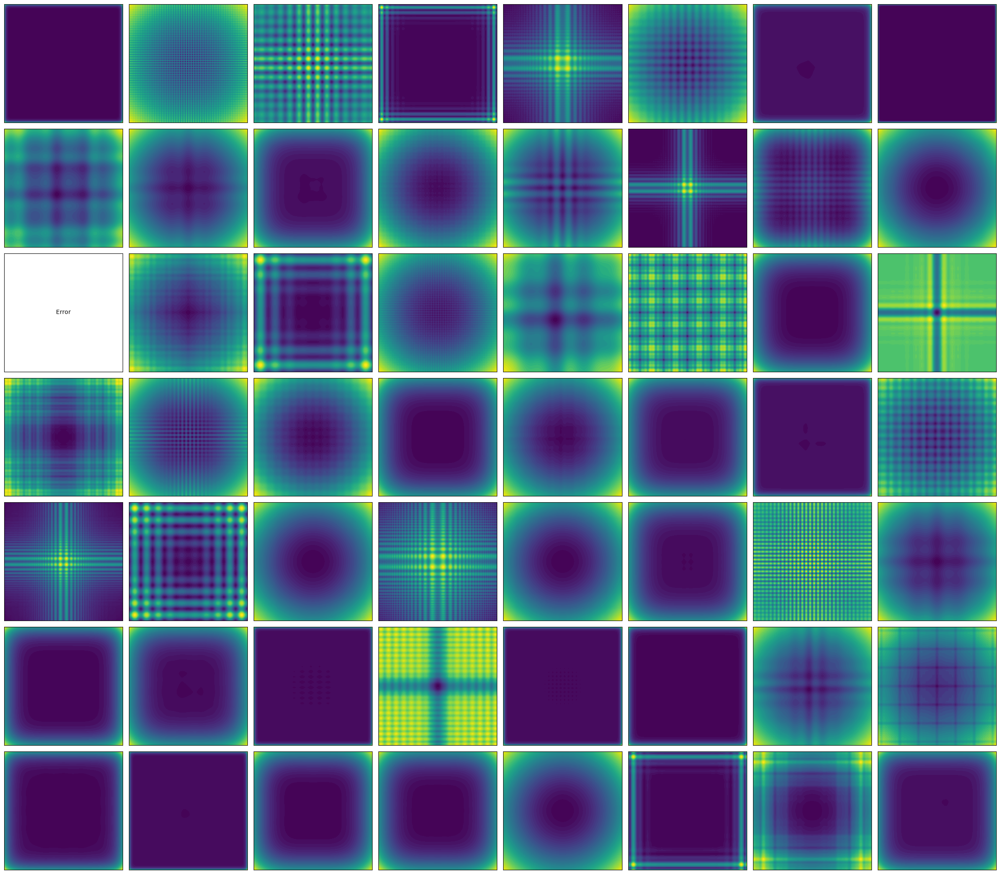

## GlobalLocal Basins

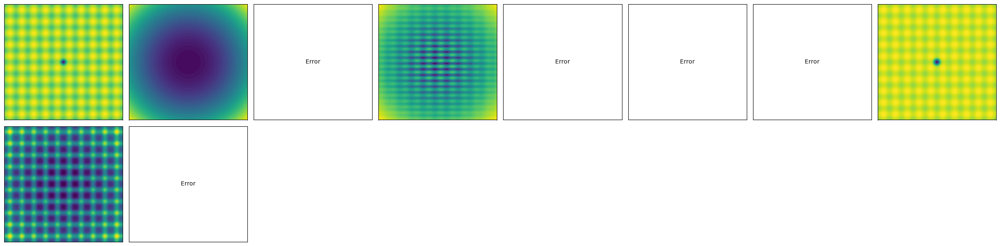

## GlobalLocal

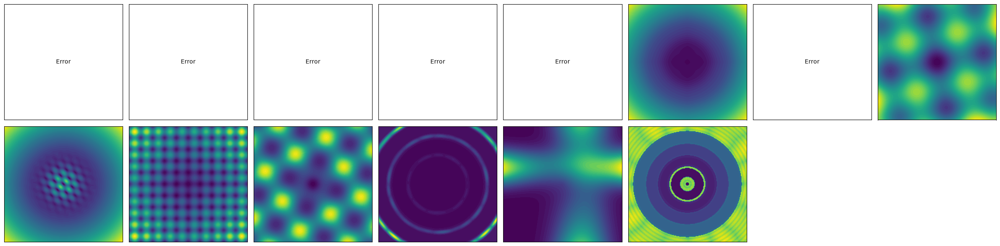

## GlobalLocal Homogeneous

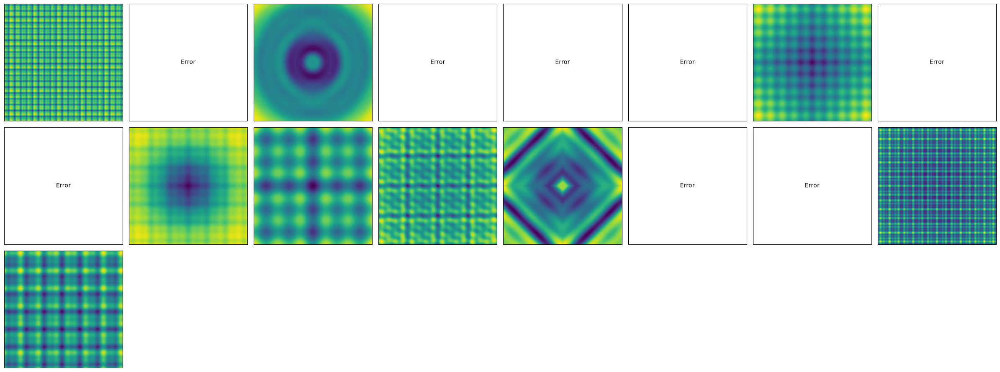

## NOT Basins GlobalLocal

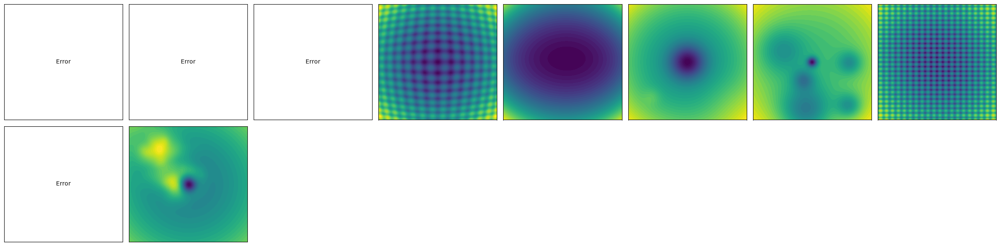

## NOT Homogeneous GlobalLocal

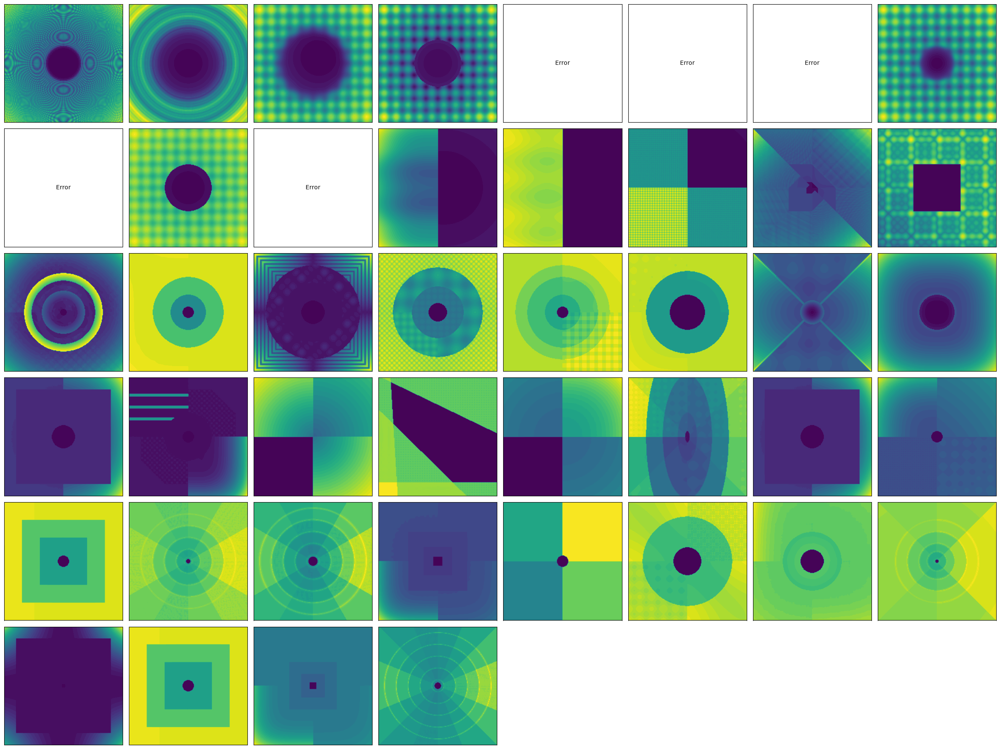

## NOT Homogeneous

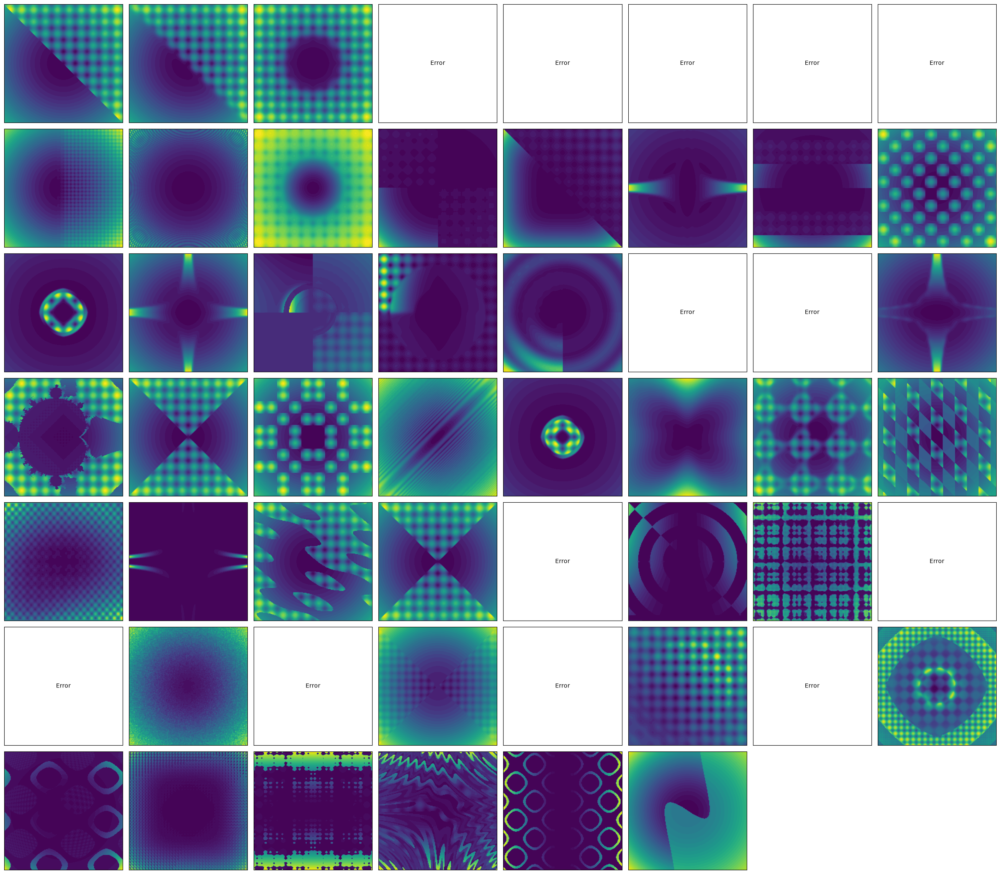

## GlobalLocal Multimodality

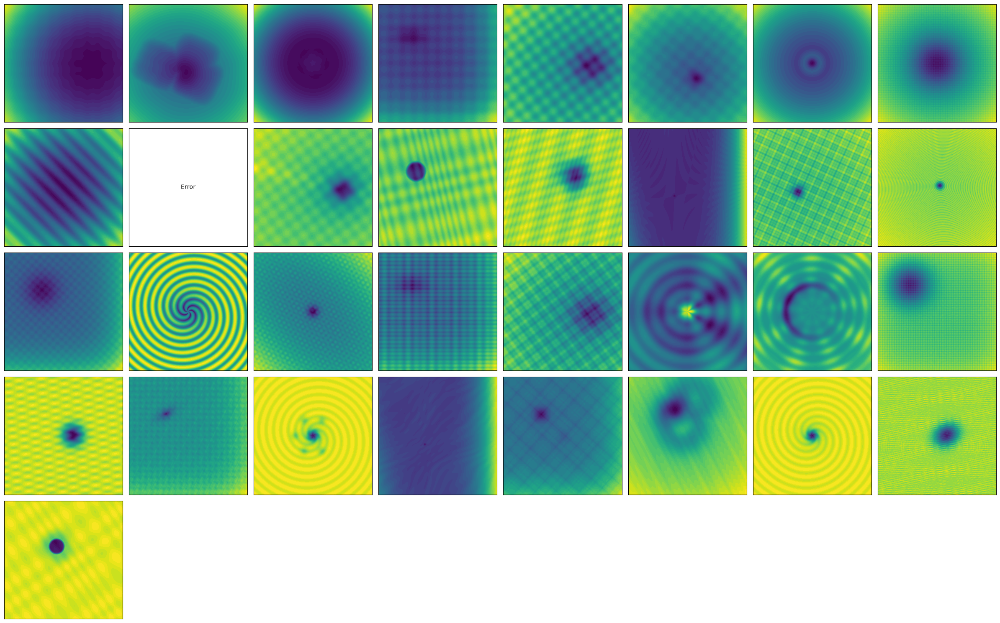

## GlobalLocal Homogeneous

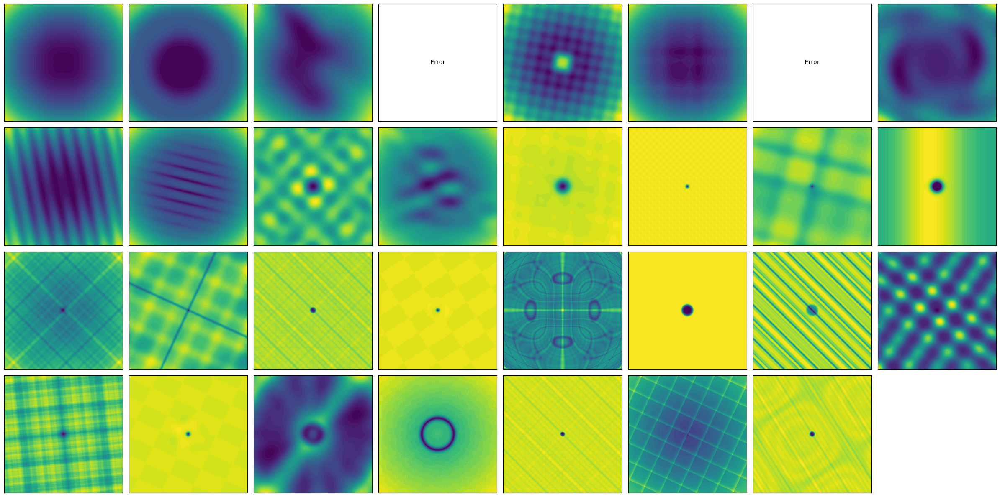

In [1]:
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
import textwrap
import re
import os
from IPython.display import display, Markdown
from itertools import product
import itertools


# Find output files in the "outputs" directory
output_dir = "outputs"
output_files = [f for f in os.listdir(output_dir) if f.endswith(".jsonl") and f.startswith("exp")]

# Select output files that have "GlobalLocal" in their name
output_files = [f for f in output_files if "GlobalLocal" in f or "NOT Homogeneous." in f]


# --- SETTINGS ---
bounds = (-5, 5)
dim = 2  # visualize in 2D
grid_points = 200  # resolution


for f in output_files:
    file_path = f"outputs/{f}" 

    filename = os.path.basename(file_path)
    match = re.search(r"-ELA-(.*?)(?:-|\.jsonl$)", filename)
    title = match.group(1).replace("_", " ") if match else filename

    # --- DISPLAY MARKDOWN TITLE ---
    display(Markdown(f"## {title}"))

    # --- LOAD JSON LINES ---
    with open(file_path, "r") as f:
        data = [json.loads(line) for line in f if line.strip()]

        # Randomly select 56 entries if there are more than 56
        if len(data) > 56:
            data = np.random.choice(data, 56, replace=False).tolist()


    n = len(data)
    cols = 8
    rows = math.ceil(n / cols)

    # --- SETUP FIGURE ---
    fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    axes = axes.flatten()

    # --- EVALUATE AND PLOT EACH LANDSCAPE ---
    # This is also an example of how you can load the Python code for each of the generated landscapes easily.
    x = np.linspace(*bounds, grid_points)
    y = np.linspace(*bounds, grid_points)
    X, Y = np.meshgrid(x, y)

    for i, entry in enumerate(data):
        ax = axes[i]
        code = entry["code"]
        try:
            # Execute class definition safely
            exec(code, globals())
            cls = globals()[entry["name"]]
            func = cls(dim=dim).f

            # Evaluate f on 2D grid
            Z = np.zeros_like(X)
            for ix in range(grid_points):
                for iy in range(grid_points):
                    Z[iy, ix] = func([X[iy, ix], Y[iy, ix]])

            # Plot
            cs = ax.contourf(X, Y, Z, levels=50, cmap="viridis")
            #ax.set_title(textwrap.shorten(entry["description"], width=60, placeholder="…"), fontsize=9)
            ax.set_xticks([])
            ax.set_yticks([])
        except Exception as e:
            # continue  # Skip this entry if there's an error
            ax.text(0.5, 0.5, f"Error", ha="center", va="center")
            ax.set_xticks([])
            ax.set_yticks([])

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    #fig.suptitle(f"2D Contour Landscapes - {title}", fontsize=14)
    plt.tight_layout()
    plt.show()
            